# 🔍 使用 Gemini Embedding 2 实现多模态检索

**利用文本、图像、音频和视频构建跨模态搜索引擎**

Gemini Embedding 2 是 Google 首款原生多模态嵌入模型。它能将文本、图像、视频、音频和文档映射到**同一个统一的嵌入空间**中，从而实现跨模态的搜索与检索。

在本 Notebook 中，我们将构建一个实用的**多模态媒体库搜索引擎**，它能让你：
- 通过**文本查询**搜索媒体库
- 通过**图像**进行搜索（利用图像查找相似内容）
- 通过**音频**进行搜索（利用音频片段查找匹配内容）
- 执行**跨模态检索**（例如：以文搜图、以图搜文等）

> **前提条件：** 你需要一个 Gemini API 密钥。可以在 [aistudio.google.com](https://aistudio.google.com/apikey) 免费获取。

In [ ]:
! pip install -q google-genai numpy scikit-learn matplotlib Pillow requests

## 1. 创建 Gemini API Key

可以在AI studio 免费体验 [Google AI Studio](https://aistudio.google.com/apikey).

In [9]:
import os
from dotenv import load_dotenv

load_dotenv()

GEMINI_API_KEY = os.getenv("GEMINI_API_KEY")
print("✅ 环境变量已设置")

✅ 环境变量已设置


In [ ]:
from google import genai
from google.genai import types
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO
import IPython.display as display
from sklearn.manifold import TSNE
import json
import urllib.request
import warnings
warnings.filterwarnings('ignore')

client = genai.Client(api_key=GEMINI_API_KEY)
MODEL = 

print("✅ Gemini client initialized")
print(f"📌 Using model: {MODEL}")

✅ Gemini client initialized
📌 Using model: gemini-embedding-2-preview


## 2. 构建多模态检索数据

我们将构建一个**旅游目的地搜索引擎** —— 这是一个典型的实际应用场景。假设一家旅行社拥有一个包含以下内容的多媒体知识库：
- 目的地的**文本描述**
- 地标与风景的**照片**
- 描述目的地的**音频讲解**
- 目的地的**短视频片段**

用户可以使用**任何模态**（文字、图片、音频或视频）来查询该系统，从而找到匹配的旅游目的地。

In [25]:
# @title Download Sample Images (with robust fallback)
import os
import urllib.request
import time
from PIL import Image
import numpy as np

os.makedirs("data/images", exist_ok=True)

In [12]:
destinations = {
    "great_wall": {
        "name": "万里长城，北京",
        "description": "长城是人类文明史上的奇迹，蜿蜒于群山之巅。游客可以领略雄伟的八达岭、险峻的箭扣，感受厚重的历史底蕴和中国古代军事建筑的壮丽，是文化寻根与徒步探险的绝佳之地。",
        "image": "data/images/Great_Wall.jpg",
        "tags": ["亚洲","历史", "文化", "建筑", "徒步"],
    },
    "forbidden_city": {
        "name": "故宫博物院，北京",
        "description": "作为明清两代的皇家宫殿，故宫是中国古代宫廷建筑的精华。红墙黄瓦间隐藏着数不尽的国宝珍玩和历史往事，在这里可以深度体验东方美学、传统礼制与禅意哲学。",
        "image": "data/images/forbidden_city.jpg",
        "tags": ["亚洲", "文化", "建筑", "传统", "历史"],
    },
    "sanya": {
        "name": "三亚，海南",
        "description": "被称为“东方夏威夷”的热带度假天堂。这里拥有亚龙湾的银白沙滩、蜈支洲岛的清澈海水以及完善的海滨度假设施。无论是享受阳光沙滩、体验潜水冲浪，还是品尝海鲜盛宴，三亚都是国内顶级的海岛旅游胜地。",
        "image": "data/images/sanya.jpg",
        "tags": ["亚洲", "海洋", "度假", "自然", "热带"],
    },
    "jiuzhaigou": {
        "name": "九寨沟，四川",
        "description": "位于川西高原的童话世界，以翠海、叠瀑、彩林、雪峰、藏情“五绝”闻名于世。如镜面般的湖泊倒映着原始森林，展现出大自然鬼斧神工的生态之美。",
        "image": "data/images/jiuzhaigou.jpg",
        "tags": ["亚洲", "自然", "山脉", "森林", "生态"],
    },
    "hulunbuir_grassland": {
        "name": "呼伦贝尔大草原, 内蒙古",
        "description": "世界著名的天然牧场，拥有辽阔的绿色草场、九曲十八弯的莫日格勒河以及成群的牛羊。蓝天白云下，一望无际的绿色地毯向天边延伸，是感受马背文化、体验游牧生活、领略壮丽草原风光的首选之地。",
        "image": "data/images/hulunbuir_grassland.jpg",
        "tags": ["亚洲", "草原", "自然", "文化", "马术"],
    },
    "huangshan": {
        "name": "黄山, 安徽",
        "description": "以“五绝”——奇松、怪石、云海、温泉、冬雪闻名于世，被称为“天下第一奇山”。黄山展现了壮丽的花岗岩峰林景观，古松危立，云海飘渺，是水墨画般的自然杰作。",
        "image": "data/images/huangshan.jpg",
        "tags": ["亚洲", "自然", "山脉", "文化", "摄影"],
    },
}

print(f"📚 已创建包含 {len(destinations)} 个目的地的知识库：")
for key, dest in destinations.items():
    print(f"   🌍 {dest['name']} - {len(dest['description'])} 字, 标签: {dest['tags']}")

📚 已创建包含 6 个目的地的知识库：
   🌍 万里长城，北京 - 78 字, 标签: ['亚洲', '历史', '文化', '建筑', '徒步']
   🌍 故宫博物院，北京 - 73 字, 标签: ['亚洲', '文化', '建筑', '传统', '历史']
   🌍 三亚，海南 - 94 字, 标签: ['亚洲', '海洋', '度假', '自然', '热带']
   🌍 九寨沟，四川 - 67 字, 标签: ['亚洲', '自然', '山脉', '森林', '生态']
   🌍 呼伦贝尔大草原, 内蒙古 - 89 字, 标签: ['亚洲', '草原', '自然', '文化', '马术']
   🌍 黄山, 安徽 - 75 字, 标签: ['亚洲', '自然', '山脉', '文化', '摄影']


In [ ]:
!pip install -q gTTS

In [13]:
from gtts import gTTS
import os

# 这里的 Key 必须和你之前定义的 destinations 字典里的 Key 保持一致，否则作为key对应
audio_narrations = {
    "great_wall": "欢迎来到万里长城，这是人类文明的奇迹，蜿蜒于群山之巅，彰显着中国古代的雄伟与智慧。",
    "forbidden_city": "走进故宫博物院，穿越明清历史，在红墙黄瓦间领略东方建筑美学的极致。",
    "sanya": "在东方夏威夷三亚，享受碧海蓝天与银白沙滩，这是国内最顶级的热带度假天堂。",
    "jiuzhaigou": "人间仙境九寨沟，以翠海、叠瀑和原始森林著称，带你进入如梦如幻的童话世界。",
    "hulunbuir_grassland": "驰骋在呼伦贝尔大草原，看牛羊成群，感受一望无际的绿色与游牧文化的豪迈。",
    "huangshan": "驰骋黄山，感受天下第一奇山的魅力，奇松、怪石与缥缈云海共铸东方水墨秘境。",
}

os.makedirs("data/audio", exist_ok=True)

for key, narration in audio_narrations.items():
    audio_path = f"data/audio/{key}.mp3"
    if not os.path.exists(audio_path):
        tts = gTTS(text=narration, lang='zh-cn', slow=False)
        tts.save(audio_path)
        print(f"🔊 已生成中文语音: {audio_path}")
    else:
        print(f"✅ 语音文件已存在: {audio_path}")
    if key in destinations:
        destinations[key]["audio"] = audio_path

print("\n🎉 所有景点的中文语音解说已准备就绪！")

✅ 语音文件已存在: data/audio/great_wall.mp3
✅ 语音文件已存在: data/audio/forbidden_city.mp3
✅ 语音文件已存在: data/audio/sanya.mp3
✅ 语音文件已存在: data/audio/jiuzhaigou.mp3
✅ 语音文件已存在: data/audio/hulunbuir_grassland.mp3
✅ 语音文件已存在: data/audio/huangshan.mp3

🎉 所有景点的中文语音解说已准备就绪！


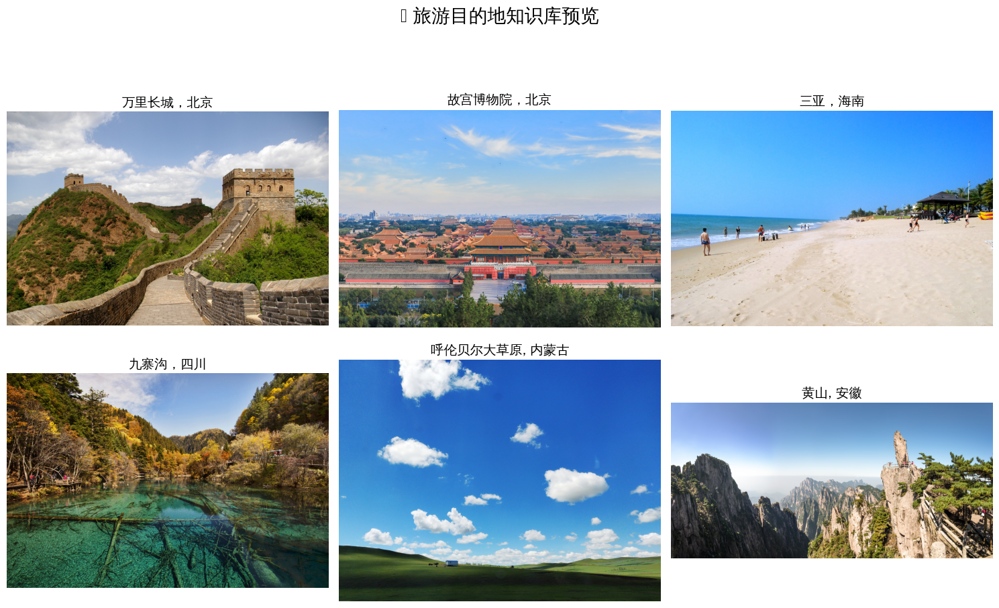


🔊 示例音频播放 (万里长城):


In [14]:
from IPython.display import Audio, HTML, display
from PIL import Image
import matplotlib.pyplot as plt
import platform

os_name = platform.system()
if os_name == "Windows":
    plt.rcParams['font.sans-serif'] = ['SimHei']
elif os_name == "Darwin":
    plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']
else:
        plt.rcParams['font.sans-serif'] = ['WenQuanYi Zen Hei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False


fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, (key, dest) in enumerate(destinations.items()):
    if idx >= len(axes): break
    
    img = Image.open(dest["image"])
    axes[idx].imshow(img)
    axes[idx].set_title(dest["name"], fontsize=14, fontweight='bold')
    axes[idx].axis("off")

plt.suptitle("🌍 旅游目的地知识库预览", fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# 播放长城介绍的mp3
print("\n🔊 示例音频播放 (万里长城):")
# 注意：请确保 data/audio/great_wall.mp3 文件已生成
if os.path.exists("data/audio/great_wall.mp3"):
    display(Audio("data/audio/great_wall.mp3"))
else:
    print("❌ 未找到音频文件，请先运行生成音频的代码。")

## 3. 生成Embeddings

现在使用Gemini Embedding 2将所有模态数据 —— 包括`text, images, and audio` —— 嵌入到**同一个向量空间**中。
这正是实现跨模态检索的关键：对于同一个概念，其文本查询和对应的图像将具有彼此接近的嵌入向量。

In [15]:
import time

def embed_text(text, task_type="RETRIEVAL_DOCUMENT"):
    """Embed a text string."""
    result = client.models.embed_content(
        model=MODEL,
        contents=text,
        config=types.EmbedContentConfig(task_type=task_type)
    )
    return np.array(result.embeddings[0].values)

def embed_image(image_path):
    """Embed an image file."""
    with open(image_path, "rb") as f:
        image_bytes = f.read()
    result = client.models.embed_content(
        model=MODEL,
        contents=types.Part.from_bytes(data=image_bytes, mime_type="image/jpeg"),
    )
    return np.array(result.embeddings[0].values)

def embed_audio(audio_path):
    """Embed an audio file."""
    with open(audio_path, "rb") as f:
        audio_bytes = f.read()
    result = client.models.embed_content(
        model=MODEL,
        contents=types.Part.from_bytes(data=audio_bytes, mime_type="audio/mpeg"),
    )
    return np.array(result.embeddings[0].values)

def cosine_sim(a, b):
    """Compute cosine similarity between two vectors."""
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

print("✅ Helper functions defined")

✅ Helper functions defined


In [17]:
import time

embedding_db = {}

for key, dest in destinations.items():
    print(f"\n🔄 Embedding: {dest['name']}...")

    # Embed text description
    print(f"   📝 Embedding text...")
    text_emb = embed_text(dest["description"])
    time.sleep(1)  # Rate limiting

    # Embed image
    print(f"   🖼️ Embedding image...")
    image_emb = embed_image(dest["image"])
    time.sleep(1)

    # Embed audio
    print(f"   🔊 Embedding audio...")
    audio_emb = embed_audio(dest["audio"])
    time.sleep(1)

    embedding_db[key] = {
        "name": dest["name"],
        "description": dest["description"],
        "image_path": dest["image"],
        "audio_path": dest["audio"],
        "tags": dest["tags"],
        "text_embedding": text_emb,
        "image_embedding": image_emb,
        "audio_embedding": audio_emb,
    }
    print(f"   ✅ Done! Embedding dimension: {len(text_emb)}")

print(f"\n🎉 All {len(embedding_db)} destinations embedded across 3 modalities!")
print(f"📊 Total embeddings: {len(embedding_db) * 3}")


🔄 Embedding: 万里长城，北京...
   📝 Embedding text...
   🖼️ Embedding image...
   🔊 Embedding audio...
   ✅ Done! Embedding dimension: 3072

🔄 Embedding: 故宫博物院，北京...
   📝 Embedding text...
   🖼️ Embedding image...
   🔊 Embedding audio...
   ✅ Done! Embedding dimension: 3072

🔄 Embedding: 三亚，海南...
   📝 Embedding text...
   🖼️ Embedding image...
   🔊 Embedding audio...
   ✅ Done! Embedding dimension: 3072

🔄 Embedding: 九寨沟，四川...
   📝 Embedding text...
   🖼️ Embedding image...
   🔊 Embedding audio...
   ✅ Done! Embedding dimension: 3072

🔄 Embedding: 呼伦贝尔大草原, 内蒙古...
   📝 Embedding text...
   🖼️ Embedding image...
   🔊 Embedding audio...
   ✅ Done! Embedding dimension: 3072

🔄 Embedding: 黄山, 安徽...
   📝 Embedding text...
   🖼️ Embedding image...
   🔊 Embedding audio...
   ✅ Done! Embedding dimension: 3072

🎉 All 6 destinations embedded across 3 modalities!
📊 Total embeddings: 18


## 4. 文本到多模态搜索

让我们使用文本查询来搜索我们的旅游数据库。由于所有模态（文字、图片、音频）都位于**同一个嵌入空间**中，系统可以同时将你的文本查询与数据库中的文本描述、图像**以及**音频解说进行对比。

In [18]:
# @title Build the Multimodal Search Engine

def search_destinations(query_embedding, top_k=3, modalities=["text", "image", "audio"]):
    """
    Search across all destinations and modalities.
    Returns ranked results with scores broken down by modality.
    """
    results = []

    for key, data in embedding_db.items():
        scores = {}
        if "text" in modalities:
            scores["text"] = cosine_sim(query_embedding, data["text_embedding"])
        if "image" in modalities:
            scores["image"] = cosine_sim(query_embedding, data["image_embedding"])
        if "audio" in modalities:
            scores["audio"] = cosine_sim(query_embedding, data["audio_embedding"])

        # Combined score (average across modalities)
        avg_score = np.mean(list(scores.values()))

        results.append({
            "key": key,
            "name": data["name"],
            "avg_score": avg_score,
            "modality_scores": scores,
            "description": data["description"],
            "image_path": data["image_path"],
            "audio_path": data["audio_path"],
        })

    # Sort by average score descending
    results.sort(key=lambda x: x["avg_score"], reverse=True)
    return results[:top_k]


def display_search_results(query_text, results, query_type="text"):
    """Visualize search results with scores."""
    print(f"{'='*70}")
    print(f"🔍 Query ({query_type}): {query_text}")
    print(f"{'='*70}\n")

    fig, axes = plt.subplots(1, len(results), figsize=(6 * len(results), 5))
    if len(results) == 1:
        axes = [axes]

    for idx, result in enumerate(results):
        # Display image
        img = Image.open(result["image_path"])
        axes[idx].imshow(img)
        title = f"#{idx+1} {result['name']}\nScore: {result['avg_score']:.4f}"
        axes[idx].set_title(title, fontsize=11, fontweight='bold')
        axes[idx].axis("off")

        # Print detailed scores
        print(f"  #{idx+1} {result['name']}")
        print(f"     📊 Average Score: {result['avg_score']:.4f}")
        for mod, score in result['modality_scores'].items():
            emoji = {"text": "📝", "image": "🖼️", "audio": "🔊"}[mod]
            print(f"     {emoji} {mod.capitalize()} score: {score:.4f}")
        print()

    plt.tight_layout()
    plt.show()

print("✅ Search engine ready!")

✅ Search engine ready!


🔍 Query (text): 我想看那些矗立在山脊之上的古代建筑遗迹

  #1 万里长城，北京
     📊 Average Score: 0.5207
     📝 Text score: 0.6127
     🖼️ Image score: 0.3758
     🔊 Audio score: 0.5736

  #2 黄山, 安徽
     📊 Average Score: 0.4972
     📝 Text score: 0.5733
     🖼️ Image score: 0.3587
     🔊 Audio score: 0.5596

  #3 故宫博物院，北京
     📊 Average Score: 0.4859
     📝 Text score: 0.5636
     🖼️ Image score: 0.3311
     🔊 Audio score: 0.5629



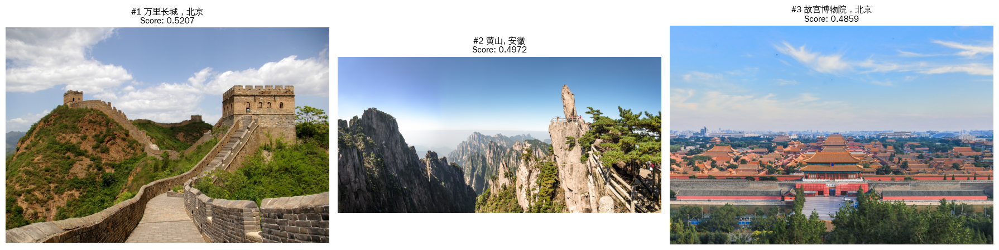

🔍 Query (text): 哪里可以在温暖的热带海水中体验浮潜和度假？

  #1 三亚，海南
     📊 Average Score: 0.5385
     📝 Text score: 0.6701
     🖼️ Image score: 0.3329
     🔊 Audio score: 0.6126

  #2 九寨沟，四川
     📊 Average Score: 0.4686
     📝 Text score: 0.5551
     🖼️ Image score: 0.3048
     🔊 Audio score: 0.5460

  #3 黄山, 安徽
     📊 Average Score: 0.4443
     📝 Text score: 0.5432
     🖼️ Image score: 0.2586
     🔊 Audio score: 0.5311



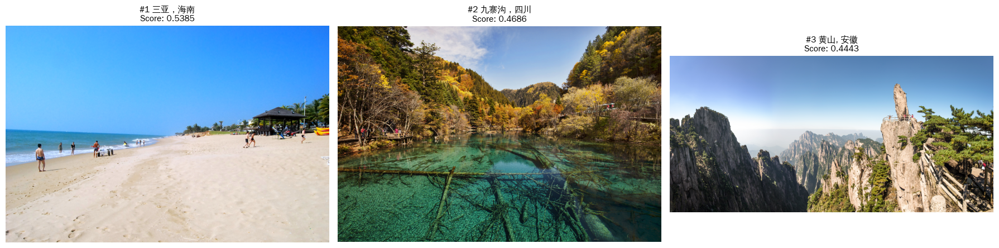

🔍 Query (text): 我想找一个充满文化底蕴、建筑精美且有历史气息的地方

  #1 故宫博物院，北京
     📊 Average Score: 0.5667
     📝 Text score: 0.7107
     🖼️ Image score: 0.3348
     🔊 Audio score: 0.6547

  #2 万里长城，北京
     📊 Average Score: 0.5352
     📝 Text score: 0.6952
     🖼️ Image score: 0.3241
     🔊 Audio score: 0.5863

  #3 呼伦贝尔大草原, 内蒙古
     📊 Average Score: 0.4993
     📝 Text score: 0.6507
     🖼️ Image score: 0.2910
     🔊 Audio score: 0.5560



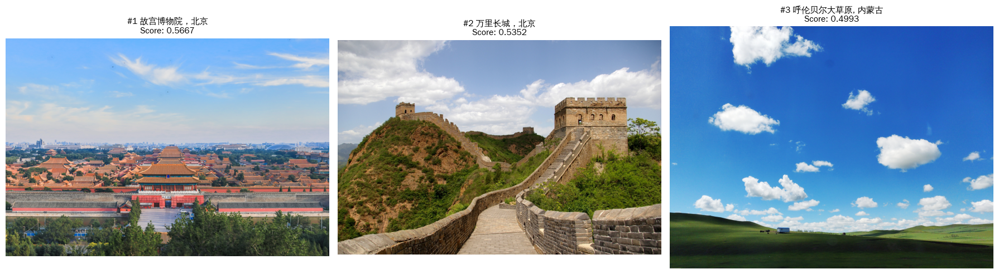

🔍 Query (text): 我渴望在星空下，于一片广袤辽阔的草原上开启冒险

  #1 呼伦贝尔大草原, 内蒙古
     📊 Average Score: 0.5606
     📝 Text score: 0.6747
     🖼️ Image score: 0.3944
     🔊 Audio score: 0.6127

  #2 九寨沟，四川
     📊 Average Score: 0.4670
     📝 Text score: 0.5942
     🖼️ Image score: 0.2578
     🔊 Audio score: 0.5491

  #3 万里长城，北京
     📊 Average Score: 0.4586
     📝 Text score: 0.5781
     🖼️ Image score: 0.2794
     🔊 Audio score: 0.5182



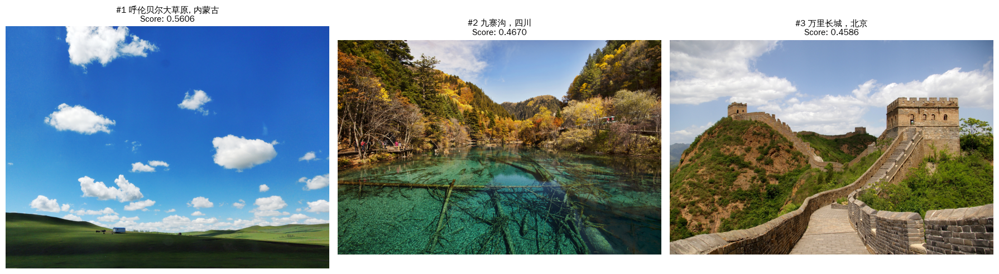

🔍 Query (text): 带我去看看那个人间仙境，有五彩斑斓的海子和如镜面般的水面倒影

  #1 九寨沟，四川
     📊 Average Score: 0.5865
     📝 Text score: 0.7513
     🖼️ Image score: 0.4041
     🔊 Audio score: 0.6040

  #2 呼伦贝尔大草原, 内蒙古
     📊 Average Score: 0.4874
     📝 Text score: 0.6269
     🖼️ Image score: 0.3045
     🔊 Audio score: 0.5308

  #3 黄山, 安徽
     📊 Average Score: 0.4858
     📝 Text score: 0.5911
     🖼️ Image score: 0.2875
     🔊 Audio score: 0.5789



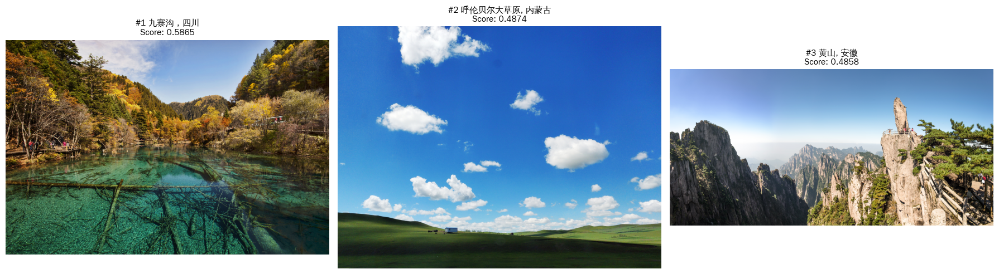

🔍 Query (text): 我想看云海缭绕的奇峰和水墨画般的山岳景观

  #1 黄山, 安徽
     📊 Average Score: 0.6164
     📝 Text score: 0.7257
     🖼️ Image score: 0.4249
     🔊 Audio score: 0.6985

  #2 九寨沟，四川
     📊 Average Score: 0.5358
     📝 Text score: 0.6504
     🖼️ Image score: 0.3440
     🔊 Audio score: 0.6130

  #3 万里长城，北京
     📊 Average Score: 0.4936
     📝 Text score: 0.6104
     🖼️ Image score: 0.3102
     🔊 Audio score: 0.5602



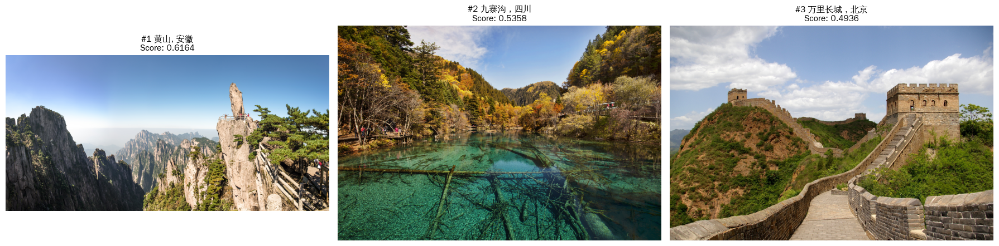

In [19]:
# 模拟用户输入的搜索查询
# 模拟用户输入的搜索查询
queries = [
    "我想看那些矗立在山脊之上的古代建筑遗迹",           # 预期匹配：万里长城
    "哪里可以在温暖的热带海水中体验浮潜和度假？",       # 预期匹配：三亚
    "我想找一个充满文化底蕴、建筑精美且有历史气息的地方", # 预期匹配：故宫
    "我渴望在星空下，于一片广袤辽阔的草原上开启冒险",   # 预期匹配：呼伦贝尔大草原
    "带我去看看那个人间仙境，有五彩斑斓的海子和如镜面般的水面倒影", # 预期匹配：九寨沟 (替换成功)
    "我想看云海缭绕的奇峰和水墨画般的山岳景观"          # 预期匹配：黄山
]

for query in queries:
    query_emb = embed_text(query, task_type="RETRIEVAL_QUERY")
    results = search_destinations(query_emb, top_k=3)
    display_search_results(query, results, query_type="text")
    time.sleep(1)

## 5. 图像到多模态搜索

现在让我们演示**跨模态检索**：我们将使用一张图像作为查询项来寻找匹配的目的地。系统会将该图像的嵌入向量与文本描述、其他图像以及音频解说进行对比——所有这些操作都在同一个统一的嵌入空间中完成。

🖼️ 正在加载本地查询图: data/images/query_grassland.jpg


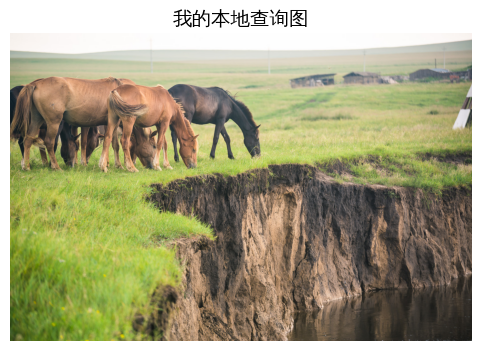


🔄 正在生成图像 Embedding...

🔍 正在进行多模态检索...
🔍 Query (image): 本地图片查询

  #1 呼伦贝尔大草原, 内蒙古
     📊 Average Score: 0.5023
     📝 Text score: 0.3865
     🖼️ Image score: 0.7371
     🔊 Audio score: 0.3834

  #2 万里长城，北京
     📊 Average Score: 0.4114
     📝 Text score: 0.2633
     🖼️ Image score: 0.6832
     🔊 Audio score: 0.2878

  #3 九寨沟，四川
     📊 Average Score: 0.4030
     📝 Text score: 0.2956
     🖼️ Image score: 0.6465
     🔊 Audio score: 0.2669



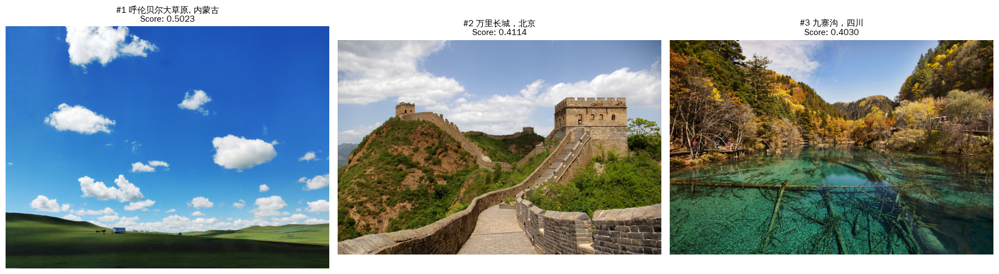

In [20]:
from PIL import Image
import matplotlib.pyplot as plt
import os

query_image_path = "data/images/query_grassland.jpg" 

if os.path.exists(query_image_path):
    print(f"🖼️ 正在加载本地查询图: {query_image_path}")
    query_img = Image.open(query_image_path)
    plt.figure(figsize=(6, 4))
    plt.imshow(query_img)
    plt.title("我的本地查询图", fontsize=14, fontweight='bold')
    plt.axis("off")
    plt.show()

    print("\n🔄 正在生成图像 Embedding...")
    query_image_emb = embed_image(query_image_path)

    print("\n🔍 正在进行多模态检索...")

    results = search_destinations(query_image_emb, top_k=3)
    
    display_search_results("本地图片查询", results, query_type="image")
else:
    print(f"❌ 找不到图片文件：{query_image_path}，请检查路径是否正确。")

## 6. 音频到多模态搜索

接下来，我们将使用**音频作为查询项** —— 想象一下用户通过口头描述来寻找目的地的情景。Gemini Embedding 2 能够原生嵌入音频数据，无需任何中间的语音转文字（Transcription）步骤。

🔊 语音查询内容:
   "我想去一个有热带海滩和清澈海水的地方，最好可以潜水看珊瑚礁和热带鱼。"



🔄 正在生成音频 Embedding...

🔍 正在使用音频查询检索目的地...
🔍 Query (audio): 我想去一个有热带海滩和清澈海水的地方，最好可以潜水看珊瑚礁和热带鱼。

  #1 三亚，海南
     📊 Average Score: 0.5606
     📝 Text score: 0.6705
     🖼️ Image score: 0.3172
     🔊 Audio score: 0.6941

  #2 九寨沟，四川
     📊 Average Score: 0.5328
     📝 Text score: 0.5984
     🖼️ Image score: 0.3402
     🔊 Audio score: 0.6597

  #3 黄山, 安徽
     📊 Average Score: 0.5014
     📝 Text score: 0.5765
     🖼️ Image score: 0.2863
     🔊 Audio score: 0.6413



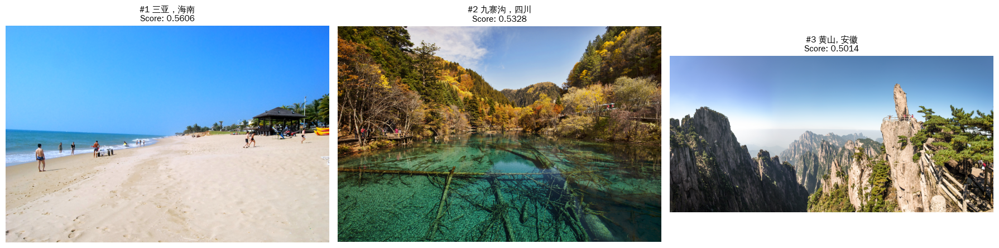


💡 提示：关于“潜水和珊瑚礁”的口头查询应该能准确命中【三亚】作为首选结果！


In [21]:
# 1. 定义查询文本：针对“三亚”的特征
query_audio_text = "我想去一个有热带海滩和清澈海水的地方，最好可以潜水看珊瑚礁和热带鱼。"
query_audio_path = "data/audio/query_sanya_search.mp3"

# 2. 生成中文音频文件 (lang='zh-cn')
if not os.path.exists(query_audio_path):
    tts = gTTS(text=query_audio_text, lang='zh-cn', slow=False)
    tts.save(query_audio_path)

print("🔊 语音查询内容:")
print(f'   "{query_audio_text}"')
display(Audio(query_audio_path))

# 3. 生成音频嵌入向量并搜索
print("\n🔄 正在生成音频 Embedding...")
# 确保你已经定义了 embed_audio 函数
query_audio_emb = embed_audio(query_audio_path)
time.sleep(1) # 稍微等待避免 API 频率限制

print("\n🔍 正在使用音频查询检索目的地...")
# 检索最匹配的前 3 个结果
results = search_destinations(query_audio_emb, top_k=3)
display_search_results(query_audio_text, results, query_type="audio")

print("\n💡 提示：关于“潜水和珊瑚礁”的口头查询应该能准确命中【三亚】作为首选结果！")

## 7. 跨模态相似度分析

让我们通过可视化，直观地展示统一嵌入空间捕捉**不同模态之间**语义相似度的效果。我们将计算每一对（文本、图像、音频）嵌入向量之间的余弦相似度，从而观察模型是如何将同一概念的不同表达形式精准对齐的。


📊 各模态对齐平均得分 (对角线均值):
   ✅ 文本 ↔ 图像: 0.4184
   ✅ 文本 ↔ 音频: 0.7441
   ✅ 图像 ↔ 音频: 0.4119


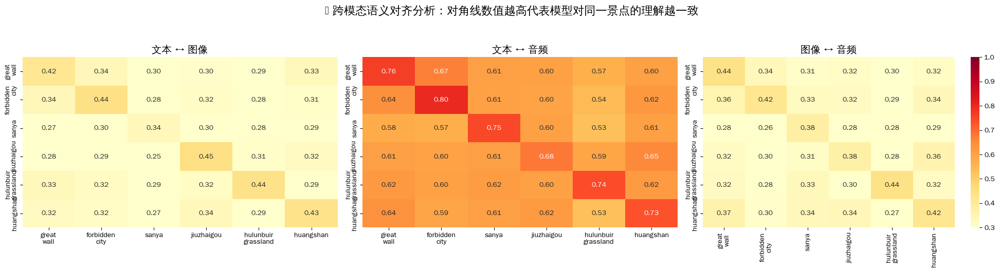

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import font_manager
import seaborn as sns
import pandas as pd
import numpy as np


available_fonts = {f.name for f in font_manager.fontManager.ttflist}
candidates = [
    'SimHei',
    'Microsoft YaHei',
    'PingFang SC',
    'Heiti SC',
    'Noto Sans CJK SC',
    'WenQuanYi Zen Hei',
    'Arial Unicode MS'
]

for font in candidates:
    if font in available_fonts:
        plt.rcParams['font.sans-serif'] = [font]
        break

plt.rcParams['axes.unicode_minus'] = False

keys = list(destinations.keys())
names = ["great\nwall", "forbidden\ncity", "sanya", "jiuzhaigou", "hulunbuir\ngrassland", "huangshan"]

modalities = [
    ("text_embedding", "image_embedding", "文本 ↔ 图像"),
    ("text_embedding", "audio_embedding", "文本 ↔ 音频"),
    ("image_embedding", "audio_embedding", "图像 ↔ 音频")
]

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

for ax, (m1, m2, title) in zip(axes, modalities):
    matrix = [[cosine_sim(embedding_db[ki][m1], embedding_db[kj][m2]) for kj in keys] for ki in keys]
    df = pd.DataFrame(matrix, index=names, columns=names)

    sns.heatmap(
        df, annot=True, fmt=".2f", cmap="YlOrRd",
        vmin=0.3, vmax=1.0, ax=ax, cbar=(ax == axes[-1])
    )
    ax.set_title(title, fontsize=14, fontweight='bold')

print("\n📊 各模态对齐平均得分 (对角线均值):")
for m1, m2, title in modalities:
    avg_sim = np.mean([cosine_sim(embedding_db[k][m1], embedding_db[k][m2]) for k in keys])
    print(f"   ✅ {title}: {avg_sim:.4f}")

plt.suptitle("🔗 跨模态语义对齐分析：对角线数值越高代表模型对同一景点的理解越一致", fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

## 8. t-SNE embedding可视化

使用 t-SNE将所有模态的嵌入向量投影到二维平面，直观地观察统一嵌入空间是如何表征的。在理想情况下，来自不同模态（文本、图像、音频）但属于同一个目的地的嵌入向量应当在空间中自动聚集在一起。

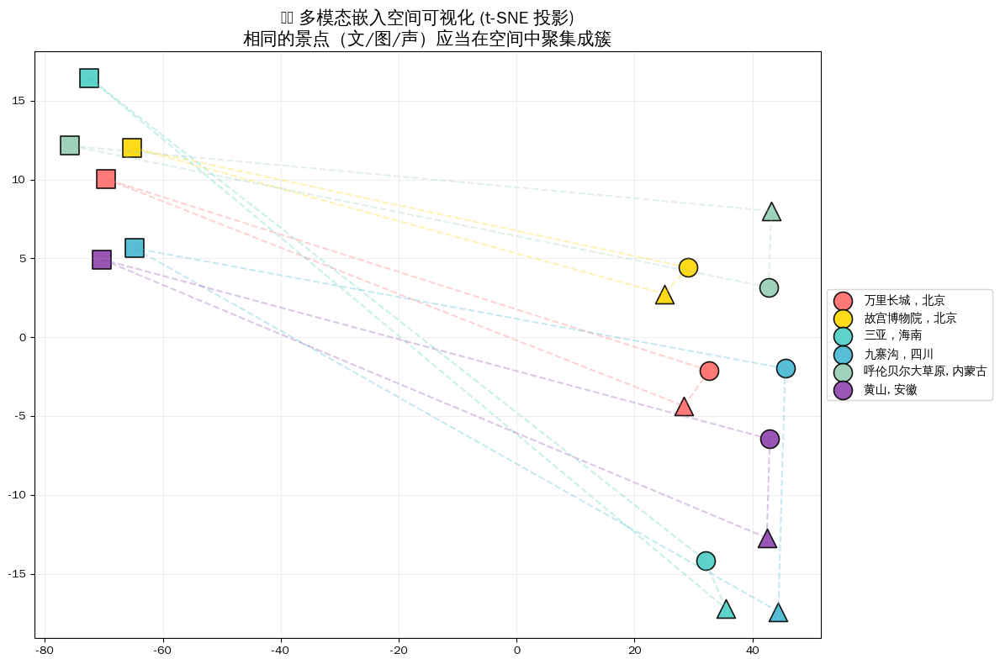

In [30]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import font_manager


candidate_fonts = [
    "SimHei", "Microsoft YaHei", "PingFang SC", "Heiti SC",
    "Noto Sans CJK SC", "Source Han Sans SC", "WenQuanYi Zen Hei",
    "Arial Unicode MS"
]

available_fonts = {f.name for f in font_manager.fontManager.ttflist}
for font in candidate_fonts:
    if font in available_fonts:
        plt.rcParams["font.sans-serif"] = [font]
        break

plt.rcParams["axes.unicode_minus"] = False  

colors_map = {
    "great_wall": "#FF6B6B",          # 红色
    "forbidden_city": "#FFD700",      # 金色
    "sanya": "#4ECDC4",               # 青色
    "jiuzhaigou": "#45B7D1",          # 蓝色
    "hulunbuir_grassland": "#96CEB4", # 草绿色
    "huangshan": "#8E44AD",           # 紫色
}
modality_markers = {"text": "o", "image": "s", "audio": "^"}

all_embeddings = []
labels = []
modality_labels = []

for key, data in embedding_db.items():
    for mod in ["text", "image", "audio"]:
        if f"{mod}_embedding" in data:
            all_embeddings.append(data[f"{mod}_embedding"])
            labels.append(key)
            modality_labels.append(mod)

all_embeddings_np = np.array(all_embeddings)
tsne = TSNE(n_components=2, random_state=42, perplexity=5, n_iter=1000)
embeddings_2d = tsne.fit_transform(all_embeddings_np)

fig, ax = plt.subplots(figsize=(12, 8))

for i, (key, mod) in enumerate(zip(labels, modality_labels)):
    ax.scatter(
        embeddings_2d[i, 0], embeddings_2d[i, 1],
        c=colors_map[key],
        marker=modality_markers[mod],
        s=250, edgecolors='black', linewidth=1.2, alpha=0.9,
        label=destinations[key]['name'] if mod == "text" else ""
    )

# 连线：让同一景点的点通过虚线连接
for key in colors_map:
    idx = [i for i, l in enumerate(labels) if l == key]
    for i in range(len(idx)):
        for j in range(i + 1, len(idx)):
            ax.plot(
                [embeddings_2d[idx[i], 0], embeddings_2d[idx[j], 0]],
                [embeddings_2d[idx[i], 1], embeddings_2d[idx[j], 1]],
                color=colors_map[key], alpha=0.3, linestyle='--'
            )

ax.set_title("🗺️ 多模态嵌入空间可视化 (t-SNE 投影)\n相同的景点（文/图/声）应当在空间中聚集成簇", fontsize=15, fontweight='bold')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.grid(True, alpha=0.2)
plt.tight_layout()
plt.show()

## 9. 俄罗斯套娃表示学习 (MRL) —— 灵活的维度

Gemini Embedding 2 支持**俄罗斯套娃表示学习 (Matryoshka Representation Learning)**。你可以将嵌入向量截断为更小的维度，同时保留绝大部分的语义信息。这对于节省存储空间和降低计算成本非常有用。接下来，让我们对比一下在不同维度下的检索质量。

🔎 用户查询: "我想找一个历史悠久、充满文化底蕴的宫廷建筑的地方"



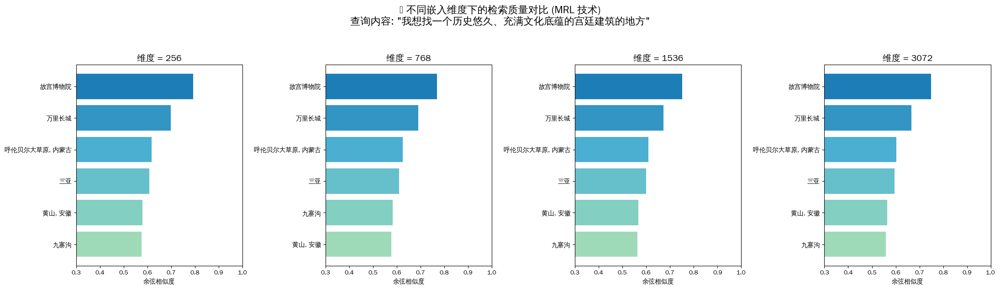


💾 存储与性能分析:
   维度  256: 占用  1024 字节/向量 | 内存节省: 91.7% | 首选结果: 故宫博物院，北京
   维度  768: 占用  3072 字节/向量 | 内存节省: 75.0% | 首选结果: 故宫博物院，北京
   维度 1536: 占用  6144 字节/向量 | 内存节省: 50.0% | 首选结果: 故宫博物院，北京
   维度 3072: 占用 12288 字节/向量 | 内存节省:  0.0% | 首选结果: 故宫博物院，北京

💡 观察发现：维度的降低确实是会影响准确性。
   节省资源和准确性，不可兼得！


In [33]:
import numpy as np
import matplotlib.pyplot as plt
import time

# 这个查询旨在寻找“故宫”或“长城”
test_query = "我想寻找一个历史悠久、建筑宏伟且充满文化底蕴的地方"
test_query = "我想找一个历史悠久、充满文化底蕴的宫廷建筑的地方"
dimensions = [256, 768, 1536, 3072]

print(f"🔎 用户查询: \"{test_query}\"\n")

results_by_dim = {}
for dim in dimensions:
    result = client.models.embed_content(
        model=MODEL,
        contents=test_query,
        config=types.EmbedContentConfig(
            task_type="RETRIEVAL_QUERY",
            output_dimensionality=dim,     # 核心：直接获取截断后的维度
        )
    )
    query_emb = np.array(result.embeddings[0].values)

    # ❗ 关键：截断后必须重新归一化 (L2 Normalization)  否则无法往后进行cosine
    query_emb = query_emb / np.linalg.norm(query_emb)

    # 在数据库中进行对比
    scores = {}
    for key, data in embedding_db.items():
        # 从数据库中取出 3072 维向量并直接截断
        trunc_emb = data["text_embedding"][:dim]
        # ❗ 关键：对数据库中的截断向量也进行重新归一化
        trunc_emb = trunc_emb / np.linalg.norm(trunc_emb)
        
        # 计算余弦相似度
        scores[key] = np.dot(query_emb, trunc_emb)

    # 排序
    ranked = sorted(scores.items(), key=lambda x: x[1], reverse=True)
    results_by_dim[dim] = ranked
    time.sleep(0.5)                 # 稍微延迟避免 API 频率限制

candidate_fonts = [
    "SimHei", "Microsoft YaHei", "PingFang SC", "Heiti SC",
    "Noto Sans CJK SC", "Source Han Sans SC", "WenQuanYi Zen Hei",
    "Arial Unicode MS"
]

available_fonts = {f.name for f in font_manager.fontManager.ttflist}
for font in candidate_fonts:
    if font in available_fonts:
        plt.rcParams["font.sans-serif"] = [font]
        break

plt.rcParams["axes.unicode_minus"] = False  
fig, axes = plt.subplots(1, len(dimensions), figsize=(22, 6))

for idx, dim in enumerate(dimensions):
    ranked = results_by_dim[dim]
    names = [embedding_db[k]["name"].split("，")[0] for k, _ in ranked]
    scores = [s for _, s in ranked]

    colors = plt.cm.GnBu(np.linspace(0.4, 0.8, len(names))) # 使用青蓝色调
    axes[idx].barh(range(len(names)), scores, color=colors[::-1])
    axes[idx].set_yticks(range(len(names)))
    axes[idx].set_yticklabels(names, fontsize=10)
    axes[idx].set_xlabel("余弦相似度")
    axes[idx].set_title(f"维度 = {dim}", fontsize=14, fontweight='bold')
    axes[idx].set_xlim(0.3, 1.0) 
    axes[idx].invert_yaxis()

plt.suptitle(f'📐 不同嵌入维度下的检索质量对比 (MRL 技术)\n查询内容: "{test_query}"',
             fontsize=16, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

# --- 3. 打印性能与成本分析 ---
print("\n💾 存储与性能分析:")
for dim in dimensions:
    # 假设每个 float32 占用 4 字节
    bytes_size = dim * 4
    top_hit = embedding_db[results_by_dim[dim][0][0]]['name']
    print(f"   维度 {dim:4d}: 占用 {bytes_size:5d} 字节/向量 | "
          f"内存节省: {(1 - dim/3072)*100:4.1f}% | "
          f"首选结果: {top_hit}")

print(f"\n💡 观察发现：维度的降低确实是会影响准确性。")
print(f"   节省资源和准确性，不可兼得！")

## 10. 组合多模态查询 (图像 + 文本)

Gemini Embedding 2 支持**交错多模态输入 (Interleaved Multimodal Input)** —— 这意味着你可以将图像和文本同时组合成一个单一的嵌入向量。这开启了极其强大的查询场景，例如：“一个像这张照片里的风景，但有更多冒险活动的地方”。

🖼️+📝 组合查询指令已发送：
   图片参考：data/images/huangshan.jpg (黄山风景)
   修正文字："但拥有深厚古代历史和精美建筑"
   → 目标：寻找融合了自然美景与人文历史的目的地
 🔍理想目标是长城


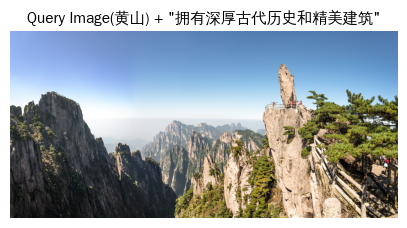

🔍 Query (image+text): 黄山 + 文字(历史建筑)

  #1 黄山, 安徽
     📊 Average Score: 0.5382
     📝 Text score: 0.4745
     🖼️ Image score: 0.7193
     🔊 Audio score: 0.4208

  #2 万里长城，北京
     📊 Average Score: 0.5167
     📝 Text score: 0.4372
     🖼️ Image score: 0.6615
     🔊 Audio score: 0.4513

  #3 故宫博物院，北京
     📊 Average Score: 0.4954
     📝 Text score: 0.4355
     🖼️ Image score: 0.6375
     🔊 Audio score: 0.4132



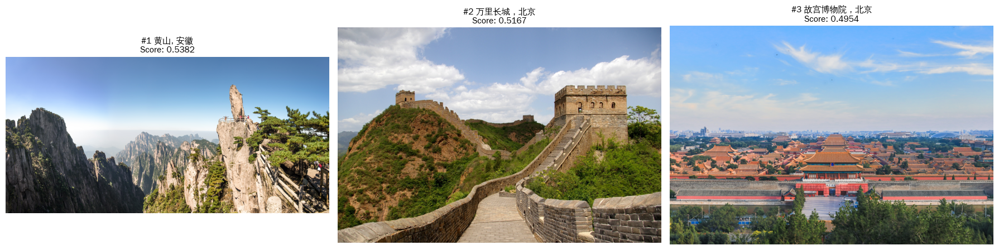


💡 这种查询方式最强大之处在于：你可以通过文字不断“调教”搜索结果，实现极度精准的定位！


In [36]:
query_image_path = "data/images/huangshan.jpg" 
with open(query_image_path, "rb") as f:
    image_bytes = f.read()

combined_result = client.models.embed_content(
    model=MODEL,
    contents=[
        types.Content(
            parts=[
                types.Part(text="一个像这张图里的风景，但拥有深厚古代历史和精美建筑的地方"),
                types.Part.from_bytes(data=image_bytes, mime_type="image/jpeg"),
            ]
        )
    ],
)

combined_emb = np.array(combined_result.embeddings[0].values)

print("🖼️+📝 组合查询指令已发送：")
print(f"   图片参考：{query_image_path} (黄山风景)")
print('   修正文字："但拥有深厚古代历史和精美建筑"')
print("   → 目标：寻找融合了自然美景与人文历史的目的地\n 🔍理想目标是长城")


plt.figure(figsize=(5, 3))
plt.imshow(Image.open(query_image_path))
plt.title('Query Image(黄山) + "拥有深厚古代历史和精美建筑"', fontsize=11)
plt.axis("off")
plt.show()

#在当前景点搜索，理想检索是长城
results = search_destinations(combined_emb, top_k=3)

# 4. 展示搜索结果
display_search_results(
    "黄山 + 文字(历史建筑)", 
    results, 
    query_type="image+text"
)

print("\n💡 这种查询方式最强大之处在于：你可以通过文字不断“调教”搜索结果，实现极度精准的定位！")

## 12. 总结与核心收获

在本 Notebook 中，我们利用 **Gemini Embedding 2** 构建了一个**多模态旅游目的地搜索引擎**，完整展示了以下成果：

- **多模态知识库**：包含 6 个精选旅游目的地，每个目的地都整合了文本描述、实拍照片和音频解说。
- **统一嵌入索引**：构建了一个跨越 3 种模态的向量空间（总计 18 个嵌入向量）。
- **全方位搜索引擎**：支持任意模态（文本、图像、音频）的查询输入，并能实现跨模态的精准检索。

**核心技术：**
1. **文本嵌入** —— 实现对目的地描述的高效语义搜索。
2. **图像嵌入** —— 实现“以图搜图”，精准定位视觉匹配的目的地。
3. **音频嵌入** —— 无需中间转录（Transcription）步骤，实现原生的语音语义理解。
4. **跨模态检索** —— 能够使用单一模态的查询，在所有其他模态的数据中寻找关联。
5. **组合多模态查询** —— 支持图像与文本的交错（Interleaved）输入，实现极度精准的意图表达。
6. **俄罗斯套娃表示学习 (MRL)** —— 提供灵活的嵌入维度（256-3072），在性能与存储成本间取得完美平衡。
7. **嵌入空间可视化** —— 通过 t-SNE 降维技术，直观展示了多模态数据在向量空间中的聚类对齐效果。

**后续步骤：**
- **规模化扩展**：引入向量数据库（如 ChromaDB, Weaviate, Pinecone）将目的地规模扩展至成千上万个。
- **新增视频支持**：为目的地的短视频宣传片添加视频嵌入功能。
- **文档嵌入**：增加对 PDF 格式旅游手册的嵌入支持。
- **构建多模态 RAG**：结合 Gemini 构建完整的检索增强生成（RAG）流水线，实现智能化的自然语言问答。
- **应用部署**：将该项目打包并部署为 Web 应用程序。

📚 **了解更多：** [Gemini Embedding 2 官方文档](https://ai.google.dev/gemini-api/docs/embeddings) 